In [45]:
%matplotlib inline
import sys
sys.path.insert(0,'..')
from IPython.display import HTML,Image,SVG,YouTubeVideo
from helpers import header

HTML(header())

#Edge detection

Edges are important features in an image, this is one of the most saillant feature that our eye catches.

Edges are also highly correlated with object borders, this is why a lot of different thechniques have been developped.

##Finite differences

Taylor's theorem:
$$
\begin{align}
f(x + h) &= f(x) + \frac{f'(x)}{1!}h + \frac{f^{(2)}(x)}{2!}h^2 + \cdots + \frac{f^{(n)}(x)}{n!}h^n + R_n(x)\\
f(x + h) &= f(x) + f'(x)h + R_1^+(x)\\
f(x - h) &= f(x) - f'(x)h + R_1^-(x)\\
\end{align}
$$

We neglect $R_1$ and we substract the two last equations:

$$
\begin{align}
f(x + h) - f(x - h) &\approx  2f'(x)h  \\
\\
f'(x) &\approx \frac{f(x + h) - f(x - h)}{2h}  \\
\\
\end{align}
$$

Similarly for $f''(x)$

$$f''(x) \approx \frac{f(x+h) - 2 f(x) + f(x-h)}{h^{2}}$$


Finite difference for 2 variables

\begin{align}
f_{x}(x,y) &\approx  \frac{f(x+h ,y) - f(x-h,y)}{2h}\\
f_{y}(x,y) &\approx  \frac{f(x,y+k ) - f(x,y-k)}{2k}\\
f_{xx}(x,y) &\approx  \frac{f(x+h ,y) - 2 f(x,y) + f(x-h,y)}{h^2}\\
f_{yy}(x,y) &\approx  \frac{f(x,y+k) - 2 f(x,y) + f(x,y-k)}{k^2}\\
f_{xy}(x,y) &\approx  \frac{f(x+h,y+k) - f(x+h,y-k) - f(x-h,y+k) + f(x-h,y-k)}{4hk}\\
\end{align}

Laplacian operator

\begin{align}
\Delta f &= \nabla^2 f = \nabla \cdot \nabla f\\
\Delta f &= \sum_{i=1}^n \frac {\partial^2 f}{\partial x^2_i}\\
\Delta f &= \nabla^2 f = \frac {\partial^2 f}{\partial x^2} + \frac {\partial^2 f}{\partial y^2}\\
\end{align}

For images,these operators are identical to convolutions with specific structuring element:

example 1D second-derivative is obtained using:

\begin{bmatrix}
1 & -2 & 1\\
\end{bmatrix}

2D Laplacian:
\begin{bmatrix}
0 & -1 & 0\\
-1 & +4 & -1\\
0 & -1 & 0\\
\end{bmatrix}

2D including diagonals:

\begin{bmatrix}
-1 & -1 & -1\\
-1 & +8 & -1\\
-1 & -1 & -1\\
\end{bmatrix}

3D Laplacian (stucturing element is a 3x3x3 cube):

\begin{bmatrix}
0 & 0 & 0\\
0 & 1 & 0\\
0 & 0 & 0\\
\end{bmatrix}

\begin{bmatrix}
0 & 1 & 0\\
1 & -6 & 1\\
0 & 1 & 0\\
\end{bmatrix}

\begin{bmatrix}
0 & 0 & 0\\
0 & 1 & 0\\
0 & 0 & 0\\
\end{bmatrix}

##gradient operator

\begin{align}
\nabla f  = \left(\frac{\partial f}{\partial x_1 }, \dots,  \frac{\partial f}{\partial x_n }  \right)
\end{align}

2D

\begin{align}
\nabla f(x, y) =
\left(\frac{\partial f}{\partial x},
\frac{\partial f}{\partial y}\right)\\
\end{align}

3D

\begin{align}
\nabla f(x, y, z) =
\left(\frac{\partial f}{\partial x},
\frac{\partial f}{\partial y},
\frac{\partial f}{\partial z}\right)\\
\end{align}

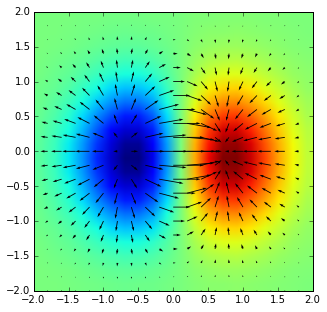

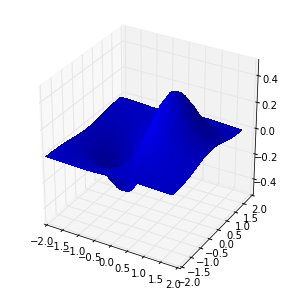

In [46]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from scipy import ndimage,interpolate
from scipy.ndimage.filters import convolve1d
from mpl_toolkits.mplot3d import Axes3D

r = np.arange(-2, 2, 0.2)
x,y = np.meshgrid(r,r)

z = x*np.exp(-x**2-y**2)

w = np.array([-1,0,+1])

dx = convolve1d(z,-w,axis=1)
dy = convolve1d(z,-w,axis=0)

plt.figure(figsize=[5,5])

plt.imshow(z,extent=[-2,2,-2,2])
plt.quiver(x,y,dx,dy)

fig3d = plt.figure(figsize=[5,5])
ax = fig3d.add_subplot(1, 1, 1, projection='3d')
surf = ax.plot_surface(x, y, z, rstride=1, cstride=1, linewidth=0, antialiased=False)

Question:
* what are the gradient fields for the following images?

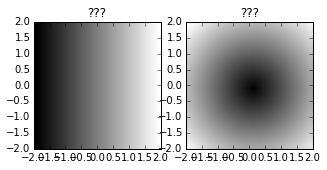

In [47]:
plt.figure(figsize=[5,5])

plt.subplot(1,2,1)
z = x
plt.imshow(z,extent=[-2,2,-2,2],cmap=cm.gray)
plt.title('???')

plt.subplot(1,2,2)
z = np.sqrt(x**2+y**2)
plt.imshow(z,extent=[-2,2,-2,2],cmap=cm.gray)
plt.title('???');


Gradient amplitude and direction

\begin{align}
amplitude &= \sqrt { (\frac{\partial f}{\partial x})^2 + (\frac{\partial f}{\partial y})^2 }\\
dir &= \tan^{-1} ( \frac{\frac{\partial f}{\partial x}} {\frac{\partial f}{\partial y}})\\
\end{align}

border detector + lowpass

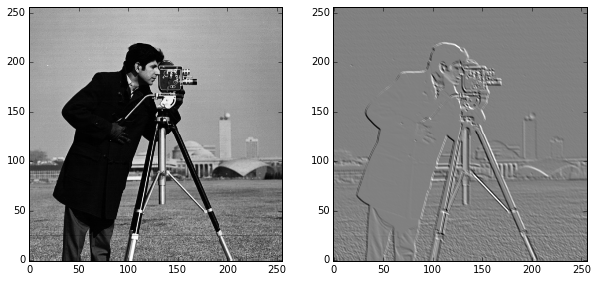

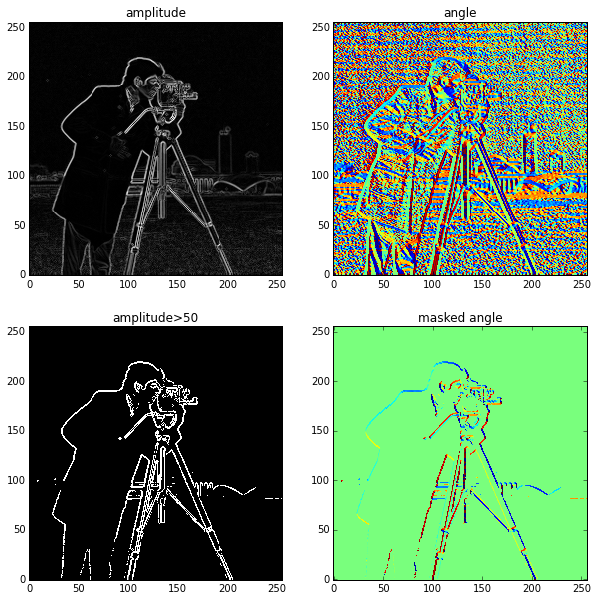

In [48]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as npy
from scipy import ndimage,interpolate
from scipy.ndimage.filters import convolve,convolve1d,gaussian_filter
from mpl_toolkits.mplot3d import Axes3D
from skimage.data import camera

def Cx(ima):
    """x' derivative of image"""
    c = convolve1d(ima,npy.array([-1,0,1]),axis=1,cval=1)
    return c/2.0

def Cy(ima):
    """y' derivative of image"""
    c = convolve1d(ima,npy.array([-1,0,1]),axis=0,cval=1)
    return c/2.0

def grad(ima):
    """gradient of an image"""
    k = npy.array([[0,1,0],[1,0,-1],[0,-1,0]])
    s = convolve(ima,k)
    return s



im = camera().astype(np.float)[-1::-2,::2]
s = grad(im)

plt.figure(figsize=[10,10])
plt.subplot(1,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(1,2,2)
plt.imshow(s,interpolation='nearest',cmap=cm.gray,origin='lower')

gx = Cx(im)
gy = Cy(im)

magnitude = np.sqrt(gx**2+gy**2)
angle = np.arctan2(gy,gx)
masked_angle = angle.copy()
masked_angle[magnitude<50]=0

plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(magnitude,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('amplitude')
plt.subplot(2,2,2)
plt.imshow(angle,interpolation='nearest',cmap=cm.jet,origin='lower')
plt.title('angle')
plt.subplot(2,2,3)
plt.imshow(magnitude>50,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('amplitude>50')
plt.subplot(2,2,4)
plt.imshow(masked_angle,interpolation='nearest',cmap=cm.jet,origin='lower')
plt.title('masked angle');

##Sobel

\begin{bmatrix}
1 & 0 & -1\\
2 & 0 & -2\\
1 & 0 & -1\\
\end{bmatrix}

\begin{bmatrix}
2 & 1 & 0\\
1 & 0 & -1\\
0 & -1 & -2\\
\end{bmatrix}

\begin{bmatrix}
1 & 2 & 1\\
0 & 0 & 0\\
-1 & -2 & -1\\
\end{bmatrix}

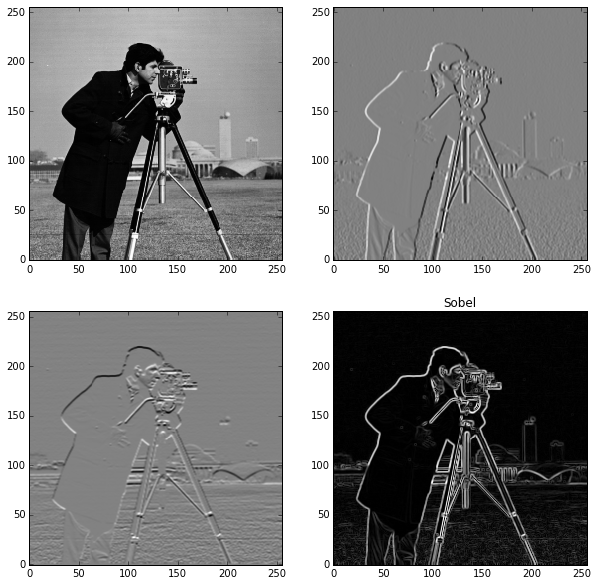

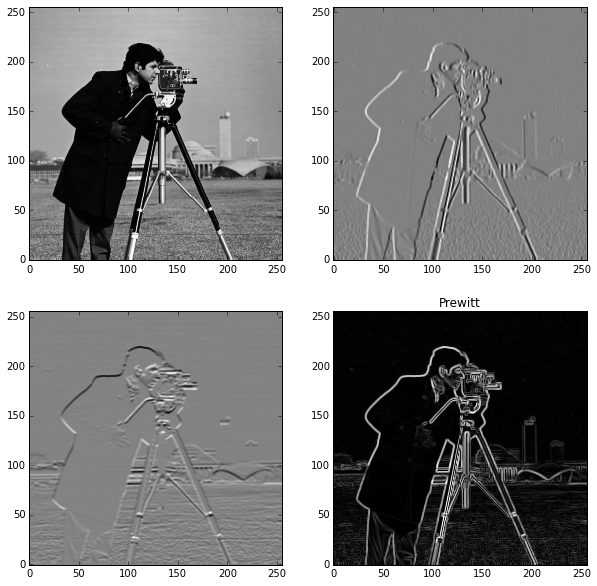

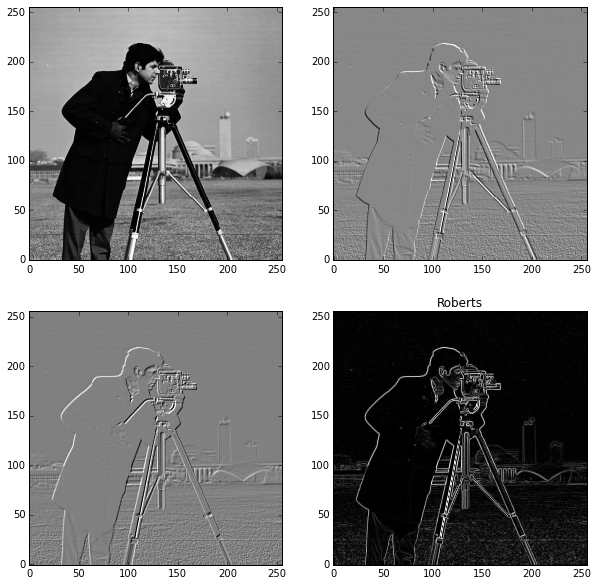

In [49]:
def sobel(ima):
    """Sobel  of image"""
    kx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
    ky = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
    sx = convolve(ima,kx)
    sy = convolve(ima,ky)
    s = np.sqrt(sx**2+sy**2)
    return (sx,sy,s)

def prewitt(ima):
    """Sobel  of image"""
    kx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
    ky = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
    sx = convolve(ima,kx)
    sy = convolve(ima,ky)
    s = np.sqrt(sx**2+sy**2)
    return (sx,sy,s)

def roberts(ima):
    """Sobel  of image"""
    kx = np.array([[1,0],[0,-1]])
    ky = np.array([[0,1],[-1,0]])
    sx = convolve(ima,kx)
    sy = convolve(ima,ky)
    s = np.sqrt(sx**2+sy**2)
    return (sx,sy,s)


sx,sy,s = sobel(im)

plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,2)
plt.imshow(sx,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,3)
plt.imshow(sy,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,4)
plt.imshow(s,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('Sobel')

sx,sy,s = prewitt(im)

plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,2)
plt.imshow(sx,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,3)
plt.imshow(sy,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,4)
plt.imshow(s,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('Prewitt')

sx,sy,s = roberts(im)

plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,2)
plt.imshow(sx,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,3)
plt.imshow(sy,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.subplot(2,2,4)
plt.imshow(s,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('Roberts');


##Difference of Gaussian (D.O.G) operator

Gaussian 2D kernel:

$g(x, y; t) = \frac {1}{2{\pi} t}e^{-(x^2+y^2)/2t}$

image convolution with a gaussian kernel:

$L(\cdot, \cdot ; t)\ = g(\cdot, \cdot ; t) * f(\cdot, \cdot)$


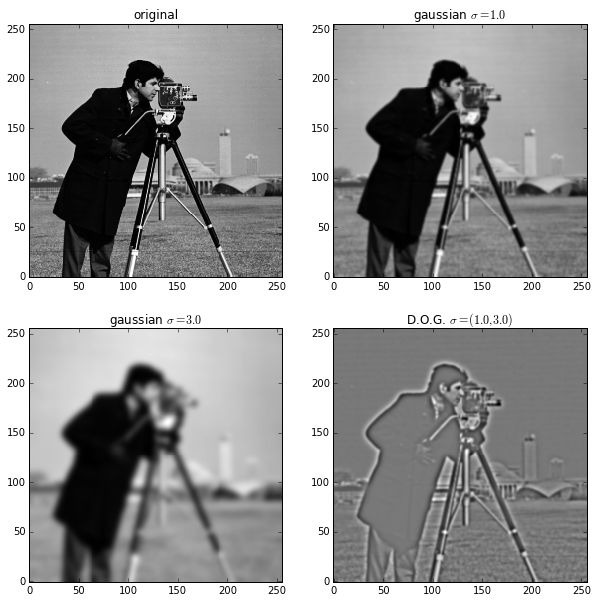

In [50]:
g1 = gaussian_filter(im,1)
g2 = gaussian_filter(im,3)


plt.figure(figsize=[10,10])
plt.subplot(2,2,1)
plt.imshow(im,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('original')
plt.subplot(2,2,2)
plt.imshow(g1,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('gaussian $\sigma=1.0$')
plt.subplot(2,2,3)
plt.imshow(g2,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('gaussian $\sigma=3.0$')
plt.subplot(2,2,4)
plt.imshow(g1-g2,interpolation='nearest',cmap=cm.gray,origin='lower')
plt.title('D.O.G. $\sigma=(1.0,3.0)$');

#Gaussian and Laplacian pyramids



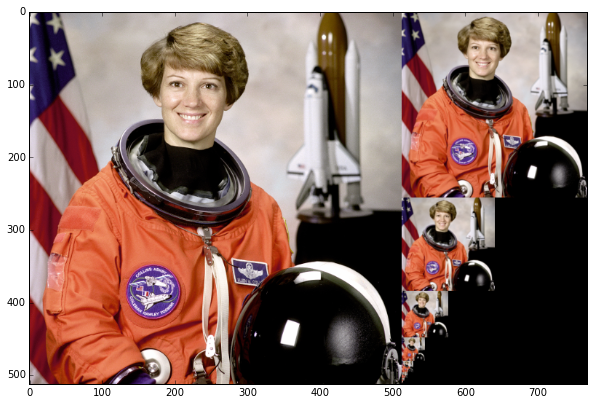

In [51]:
from skimage import data
from skimage.transform import pyramid_gaussian,pyramid_laplacian


image = data.astronaut()
rows, cols, dim = image.shape
pyramid = tuple(pyramid_gaussian(image, downscale=2))

composite_image = np.zeros((rows, cols + cols / 2, 3), dtype=np.double)

composite_image[:rows, :cols, :] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p
    i_row += n_rows

plt.figure(figsize=[10,10])
plt.imshow(composite_image);

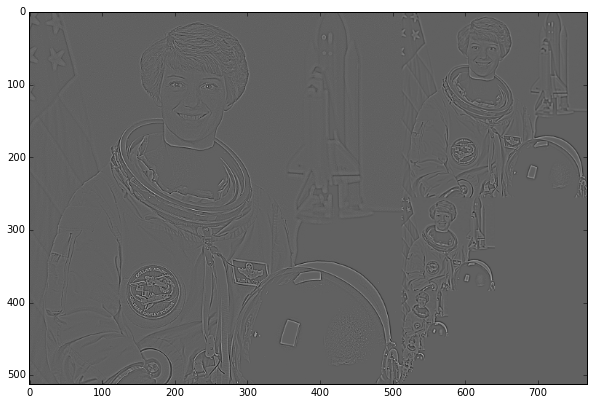

In [52]:
pyramid = tuple(pyramid_laplacian(image[:,:,0], downscale=2))

composite_image = np.zeros((rows, cols + cols / 2), dtype=np.double)

composite_image[:rows, :cols] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p
    i_row += n_rows

plt.figure(figsize=[10,10])
plt.imshow(composite_image,cmap=cm.gray);

##Canny edge detection



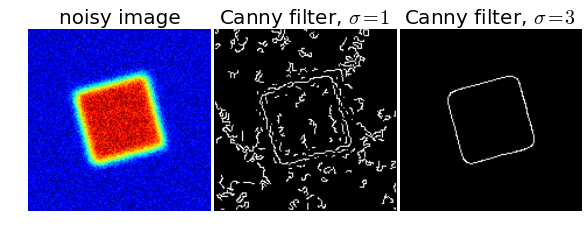

In [53]:
from scipy import ndimage

from skimage import feature


# Generate noisy image of a square
im = np.zeros((128, 128))
im[32:-32, 32:-32] = 1

im = ndimage.rotate(im, 15, mode='constant')
im = ndimage.gaussian_filter(im, 4)
im += 0.2 * np.random.random(im.shape)

# Compute the Canny filter for two values of sigma
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=3)

# display results
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(8, 3))

ax1.imshow(im, cmap=plt.cm.jet)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)

ax2.imshow(edges1, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title('Canny filter, $\sigma=1$', fontsize=20)

ax3.imshow(edges2, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title('Canny filter, $\sigma=3$', fontsize=20)

fig.subplots_adjust(wspace=0.02, hspace=0.02, top=0.9,
                    bottom=0.02, left=0.02, right=0.98)


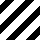
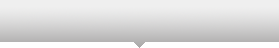
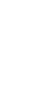
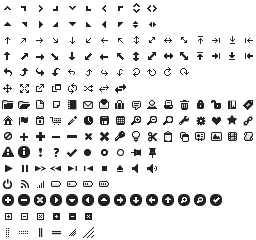
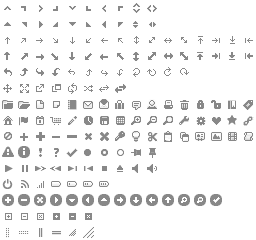
...
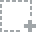
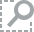
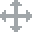
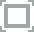
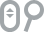

In [54]:
import bokeh.plotting as bk
from helpers import bk_image,bk_image_hoover,bk_compare_image
bk.output_notebook()

In [55]:
im = camera()[-1::-1]
canny = feature.canny(im)*255

bk_compare_image(im,canny)


In [56]:
im = camera()[-1::-1,:].astype(np.float)
_,_,fsobel = sobel(im) 

norm = 255*fsobel/np.max(fsobel)

bk_compare_image(im,norm)
